# IT5100F - Project: HDB Flat Resale Price Prediction
Semester: AY2023/24 Semester 2

## Team submitting the assignment

|Team member | Name | NUSNet ID (exxxxxxx) | Student number (AxxxxxxxZ) |
|------------|------|----------------------|----------------------------|
| 1 | Lu Xinhang             | E1237723                   | A0286161A                          |
|2  | Xiao Huiting             | E1143474                  |A0279661N |
| 3|Sun Jingjing|E1237234|A0286172Y|
|4|Yang Chenyue|E1143831|A0280018M|

## 1. Problem definition:
Land is an extremely limited resource in Singapore, where a population of over 5.6 million resides within the confines of a 719 km² country. As migration numbers rise, housing emerges as a paramount necessity for the inhabitants of this nation. Housing Development Board (HDB) flats, designed by the Singapore government in 1960 to address the demand for urban housing, accommodate over 80% of Singapore's residents.
This project delves into predicting the resale prices of HDB flats to gain a deeper understanding of the nation's housing costs. The data pipeline can also serve as an analytical tool for prediction of the future resale price.

## 2. Data collection and exploration

In [81]:
import pandas as pd
import numpy as np
from sklearn.neighbors import KNeighborsClassifier
from math import sin, cos, sqrt, atan2, radians
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

Load dataset: HDB resale dataset, zipcode mapper dataset, school information dataset and HDB mrt information dataset.

In [2]:
resale_dataset = pd.read_csv("/content/sample_data/ResaleflatpricesbasedonregistrationdatefromJan2017onwards.csv")
zipcode_mapper = pd.read_csv("/content/sample_data/sg_zipcode_mapper_utf.csv")
school = pd.read_csv("/content/sample_data/Generalinformationofschools.csv")

In [3]:
mrt_locations = pd.read_csv("/content/sample_data/mrt_data.csv")
mrt_locations.drop(columns=['type'], inplace=True)

mall_locations = pd.read_csv("/content/sample_data/mall_coordinates_updated.csv")
hospital_locations = pd.read_csv("/content/sample_data/sg-hospital-data.csv")

In [4]:
resale_dataset['year'] = pd.to_datetime(resale_dataset['month']).dt.year
resale_dataset['month'] = pd.to_datetime(resale_dataset['month']).dt.month

Preprocess HDB resale dataset: Use year information from column 'month' to create a new column 'year'; Add a new column 'price_per_sqm' calculated using 'resale_price' and 'floor_area_sqm'; Change the 'ramaining_lease' column, only reserve year information; Drop columns not used.

In [6]:
resale_dataset['price_per_sqm'] = resale_dataset['resale_price'] / resale_dataset['floor_area_sqm']
resale_dataset['remaining_lease'] = (99 + resale_dataset['lease_commence_date']) - resale_dataset['year']

According to community development councils of Singapore, map each town to its corresponding community development council and create a new column 'zone' to represent.

In [7]:
zone_mapping = {
    'ANG MO KIO': 'North East',
    'BEDOK': 'East',
    'BISHAN': 'Central',
    'BUKIT BATOK': 'West',
    'BUKIT MERAH': 'Central',
    'BUKIT PANJANG': 'West',
    'BUKIT TIMAH': 'Central',
    'CENTRAL AREA': 'Central',
    'CHOA CHU KANG': 'West',
    'CLEMENTI': 'West',
    'GEYLANG': 'East',
    'HOUGANG': 'North East',
    'JURONG EAST': 'West',
    'JURONG WEST': 'West',
    'KALLANG/WHAMPOA': 'Central',
    'MARINE PARADE': 'East',
    'PASIR RIS': 'North East',
    'PUNGGOL': 'North East',
    'QUEENSTOWN': 'West',
    'SEMBAWANG': 'North East',
    'SENGKANG': 'North East',
    'SERANGOON': 'North East',
    'TAMPINES': 'East',
    'TOA PAYOH': 'Central',
    'WOODLANDS': 'North West',
    'YISHUN': 'North West'
}

resale_dataset['zone'] = resale_dataset['town'].map(zone_mapping)

Use bar chart to plot the average resale price over year 2017-2024 for each zone. According to the plot, we can see that central region has the highest average resale price over these years.

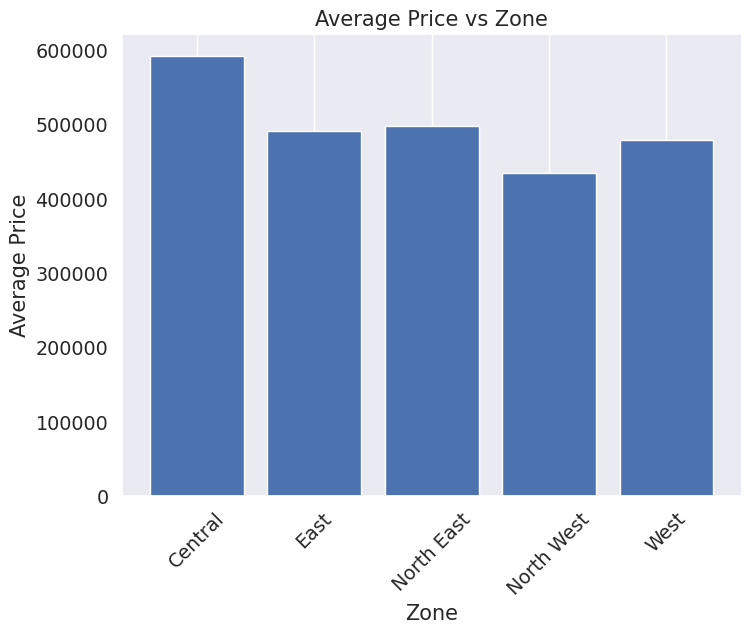

In [82]:
avg_price_per_zone = resale_dataset.groupby('zone')['resale_price'].mean().reset_index()
plt.figure(figsize=(8, 6))
plt.bar(avg_price_per_zone['zone'], avg_price_per_zone['resale_price'])
plt.xlabel('Zone')
plt.ylabel('Average Price')
plt.title('Average Price vs Zone')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()

Use line chart to plot the average resale price trend VS month to show the price trend.

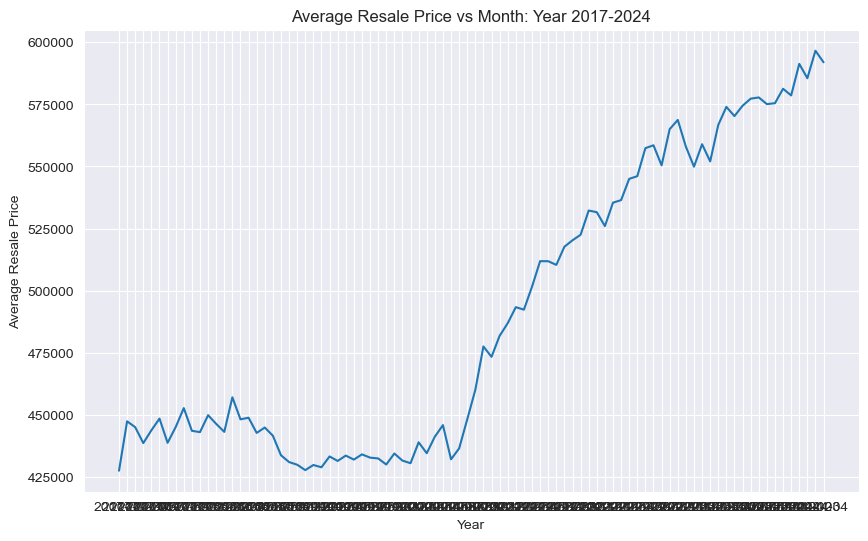

In [ ]:
avg_price_per_month = resale_dataset.groupby(['month'])['resale_price'].mean().reset_index()
plt.figure(figsize=(10, 6))
plt.plot(avg_price_per_month['month'], avg_price_per_month['resale_price'])
plt.xlabel('Year')
plt.ylabel('Average Resale Price')
plt.title('Average Resale Price vs Month: Year 2017-2024')
plt.show()

Create a new dataframe containing HDB location information 'resale_zipcode': Merge resale_dataset and zipcode_mapper based on 'block' and 'street_name', only include the rows where there are matching values in both datasets. Drop unrelated columns in this dataset.

In [8]:
zipcode_mapper.drop_duplicates(subset=['block', 'street_name'], keep='first', inplace=True)
resale_zipcode = pd.merge(resale_dataset, zipcode_mapper, how='inner', on=['block', 'street_name'])
resale_zipcode = resale_zipcode.drop(columns=['Unnamed: 0', 'postal.1'])

Create a new dataframe containing school location information 'school_zipcode': Rename 'postal_code' and 'dgp_code' for merging with zipcode_mapper dataset and alignment with the resale dataset 'town'. Merge school and zipcode_mapper based on 'postal', only include the rows where there are matching values in both datasets. Drop unrelated columns in this dataset. [Useful info in 'school_zipcode': 'town', 'zone_code'(NORTH/SOUTH/EAST/WEST)...]

In [9]:
school.rename(columns={'postal_code': 'postal', 'dgp_code': 'town'}, inplace=True)
school_zipcode = pd.merge(school, zipcode_mapper, how='inner', on='postal')
school_zipcode.drop_duplicates(subset=['school_name'], inplace=True)
school_zipcode = school_zipcode.drop(columns=['url_address', 'telephone_no',
       'telephone_no_2', 'fax_no', 'fax_no_2', 'email_address', 'principal_name', 'first_vp_name', 'second_vp_name',
       'third_vp_name', 'fourth_vp_name', 'fifth_vp_name', 'sixth_vp_name', 'postal.1', 'sap_ind', 'autonomous_ind', 'gifted_ind', 'ip_ind', 'Unnamed: 0', 'nature_code', 'session_code',])

Use bar chart to plot the average resale price over year 2017-2024 for each zone. According to the plot, we can see that central region has the highest average resale price over these years.

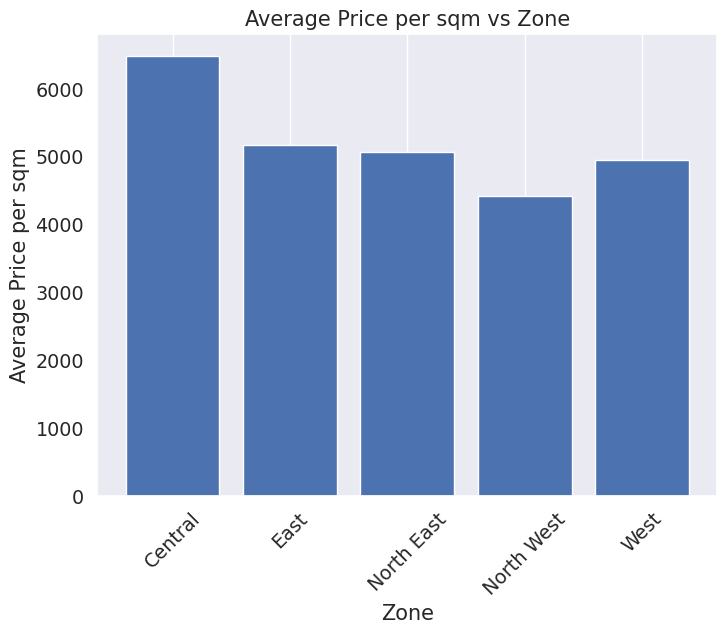

In [88]:
avg_price_per_zone = resale_zipcode.groupby('zone')['price_per_sqm'].mean().reset_index()
plt.figure(figsize=(8, 6))
plt.bar(avg_price_per_zone['zone'], avg_price_per_zone['price_per_sqm'])
plt.xlabel('Zone')
plt.ylabel('Average Price per sqm')
plt.title('Average Price per sqm vs Zone')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()

Utilize a line chart to illustrate the average trend of resale prices over months, revealing fluctuations in prices. The visualization indicates a pattern of seasonality, with resale prices typically peaking at the end and start of each year, surpassing prices observed during other periods throughout the year.

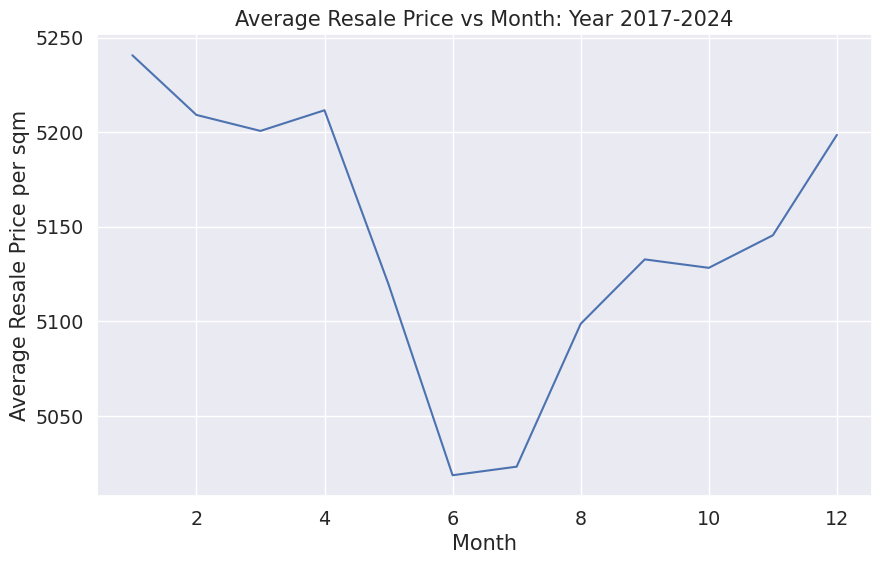

In [89]:
avg_price_per_month = resale_zipcode.groupby(['month'])['price_per_sqm'].mean().reset_index()
plt.figure(figsize=(10, 6))
plt.plot(avg_price_per_month['month'], avg_price_per_month['price_per_sqm'])
plt.xlabel('Month')
plt.ylabel('Average Resale Price per sqm')
plt.title('Average Resale Price vs Month: Year 2017-2024')
plt.show()

Employ a line chart to display the average trend of resale prices over the years, showcasing the price evolution across different years. Notably, the resale prices exhibit an almost exponential growth from 2020 to 2023, with a noticeable deceleration observed in 2024.

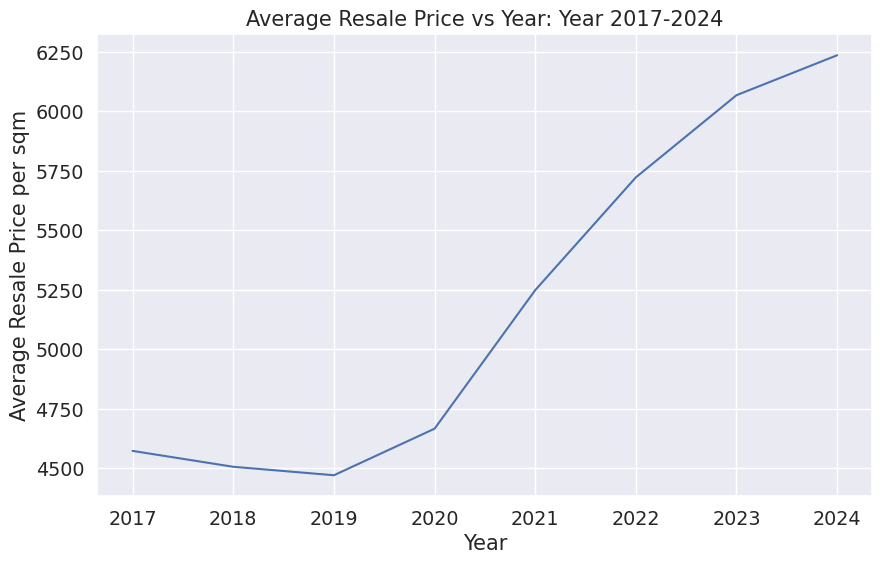

In [90]:
avg_price_per_month = resale_zipcode.groupby(['year'])['price_per_sqm'].mean().reset_index()
plt.figure(figsize=(10, 6))
plt.plot(avg_price_per_month['year'], avg_price_per_month['price_per_sqm'])
plt.xlabel('Year')
plt.ylabel('Average Resale Price per sqm')
plt.title('Average Resale Price vs Year: Year 2017-2024')
plt.show()

Utilize a line chart to depict the average resale prices across different towns over the years. Predictably, the downtown area consistently boasts the highest resale prices compared to other regions nationwide.

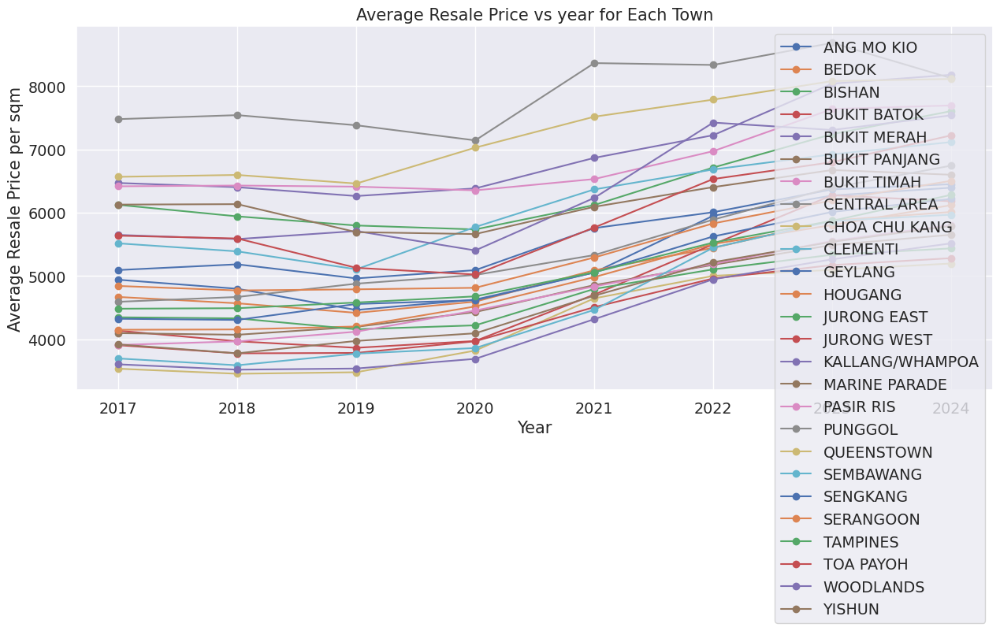

In [93]:
avg_price_per_year = resale_zipcode.groupby(['town', 'year'])['price_per_sqm'].mean().reset_index()
plt.figure(figsize=(15, 6))
for town in avg_price_per_year['town'].unique():
    town_subset = avg_price_per_year[avg_price_per_year['town'] == town]
    plt.plot(town_subset['year'], town_subset['price_per_sqm'], marker='o', label=town)
plt.xlabel('Year')
plt.ylabel('Average Resale Price per sqm')
plt.title('Average Resale Price vs year for Each Town')
plt.legend()
plt.grid(True)
plt.show()

Use KNN to train on the dataset and predict the nearest school, mrt, hospital and mall for each HDB property in resale_zipcode dataset.

In [10]:
def earth_distance(x, y):

  # Approximate radius of earth in km
  R = 6373.0

  lat1, lng1 = radians(x[0]), radians(x[1])
  lat2, lng2 = radians(y[0]), radians(y[1])

  dlon = lng2 - lng1
  dlat = lat2 - lat1

  a = sin(dlat / 2)**2 + cos(lat1) * cos(lat2) * sin(dlon / 2)**2
  c = 2 * atan2(sqrt(a), sqrt(1 - a))

  return R * c

knn = KNeighborsClassifier(n_neighbors=1)
knn.fit(school_zipcode[['lat', 'lng']], school_zipcode['school_name'])
resale_zipcode['nearest_school'] = knn.predict(resale_zipcode[['lat', 'lng']])

_, nearest_indices = knn.kneighbors(resale_zipcode[['lat', 'lng']])

nearest_school_coords = school_zipcode.iloc[nearest_indices.flatten()][['lat', 'lng']].values

resale_zipcode['school_dist'] = [
    earth_distance((lat1, lng1), (lat2, lng2))
    for (lat1, lng1), (lat2, lng2) in zip(resale_zipcode[['lat', 'lng']].values, nearest_school_coords)
]

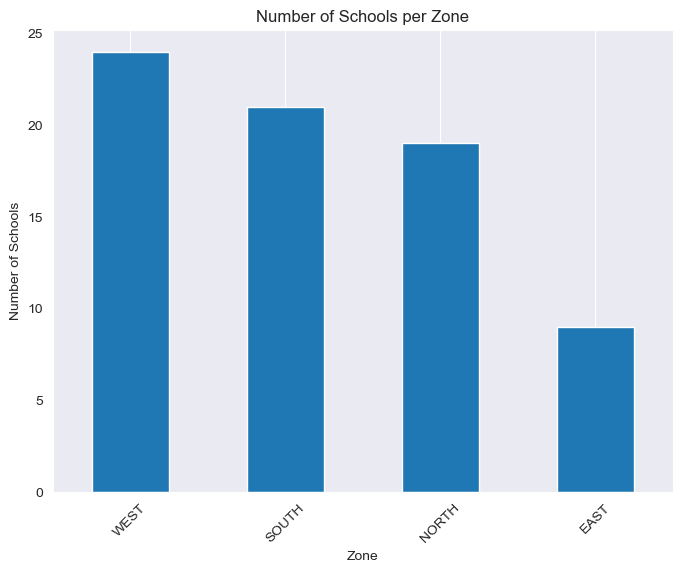

In [ ]:
school_count_per_zone = school_zipcode['zone_code'].value_counts()
plt.figure(figsize=(8, 6))
school_count_per_zone.plot(kind='bar')
plt.xlabel('Zone')
plt.ylabel('Number of Schools')
plt.title('Number of Schools per Zone')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()

In [11]:
knn = KNeighborsClassifier(n_neighbors=1)
knn.fit(hospital_locations[['lat', 'lng']], hospital_locations['name'])
resale_zipcode['nearest_hospital'] = knn.predict(resale_zipcode[['lat', 'lng']])

_, nearest_indices = knn.kneighbors(resale_zipcode[['lat', 'lng']])

nearest_mrt_coords = mrt_locations.iloc[nearest_indices.flatten()][['lat', 'lng']].values

resale_zipcode['hospital_dist'] = [
    earth_distance((lat1, lng1), (lat2, lng2))
    for (lat1, lng1), (lat2, lng2) in zip(resale_zipcode[['lat', 'lng']].values, nearest_mrt_coords)
]

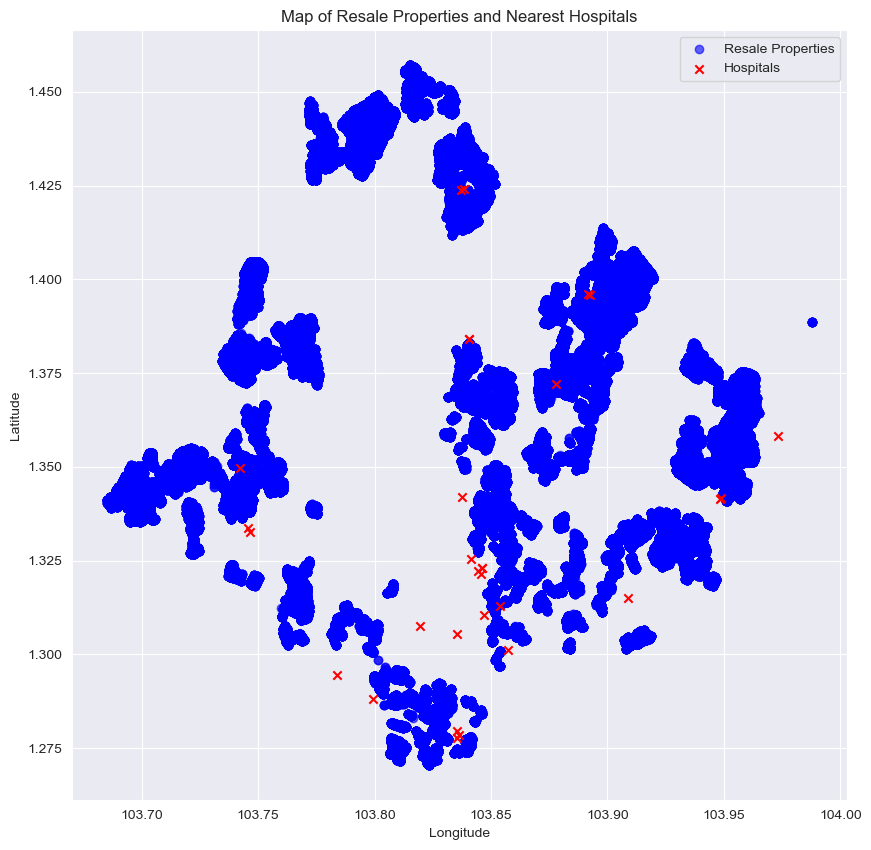

In [ ]:
# Visualize the locations of resale properties and the nearest hospital using a scatter plot
plt.figure(figsize=(10, 10))
plt.scatter(resale_zipcode['lng'], resale_zipcode['lat'], alpha=0.6, label='Resale Properties', color='blue')
plt.scatter(hospital_locations['lng'], hospital_locations['lat'], marker='x', label='Hospitals', color='red')
plt.title('Map of Resale Properties and Nearest Hospitals')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend()
plt.show()

D:\Users\logic\anaconda3\envs\rec-py\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


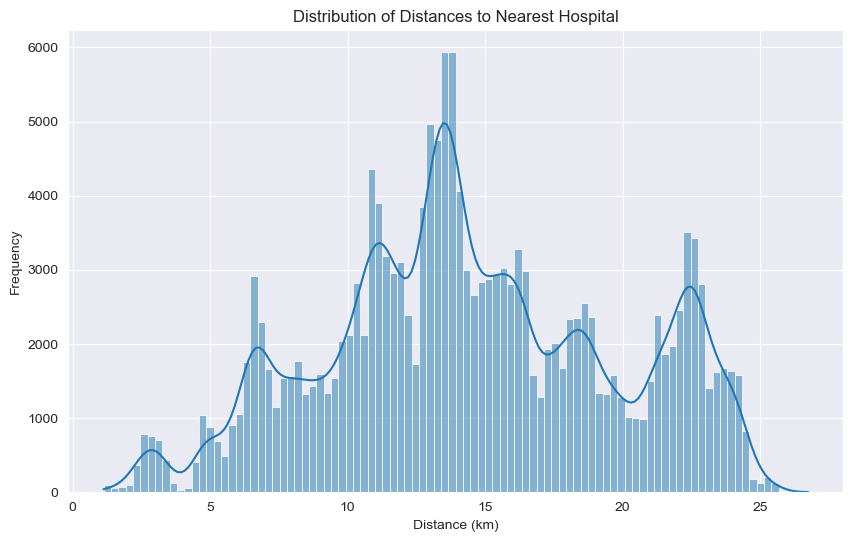

In [ ]:
# Plotting the distribution of distances to the nearest hospital
plt.figure(figsize=(10, 6))
sns.histplot(resale_zipcode['hospital_dist'], kde=True)
plt.title('Distribution of Distances to Nearest Hospital')
plt.xlabel('Distance (km)')
plt.ylabel('Frequency')
plt.show()

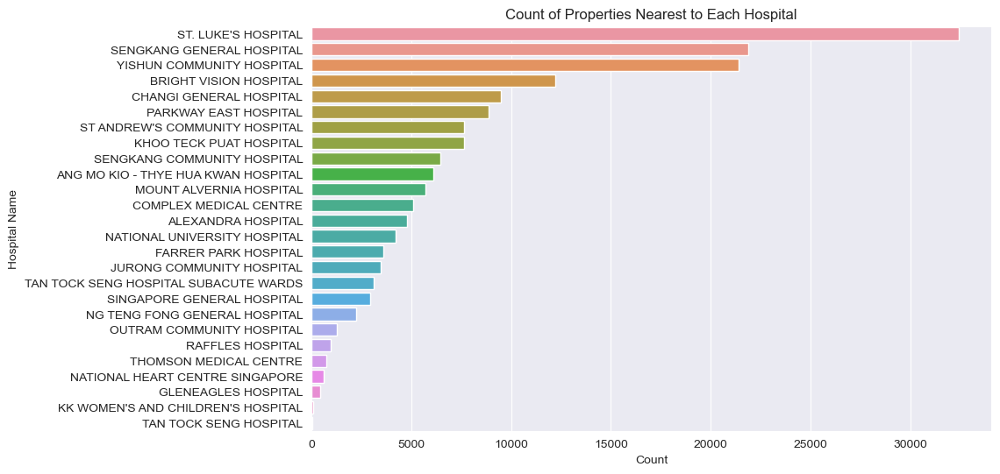

In [ ]:
# use a bar plot to show the count of properties nearest to each hospital
plt.figure(figsize=(10, 6))
sns.countplot(data=resale_zipcode, y='nearest_hospital', order=resale_zipcode['nearest_hospital'].value_counts().index)
plt.title('Count of Properties Nearest to Each Hospital')
plt.xlabel('Count')
plt.ylabel('Hospital Name')
plt.show()

In [12]:
knn = KNeighborsClassifier(n_neighbors=1)
knn.fit(mrt_locations[['lat', 'lng']], mrt_locations['station_name'])

resale_zipcode['nearest_mrt'] = knn.predict(resale_zipcode[['lat', 'lng']])

_, nearest_indices = knn.kneighbors(resale_zipcode[['lat', 'lng']])

nearest_mrt_coords = mrt_locations.iloc[nearest_indices.flatten()][['lat', 'lng']].values

resale_zipcode['mrt_dist'] = [
    earth_distance((lat1, lng1), (lat2, lng2))
    for (lat1, lng1), (lat2, lng2) in zip(resale_zipcode[['lat', 'lng']].values, nearest_mrt_coords)
]

D:\Users\logic\anaconda3\envs\rec-py\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


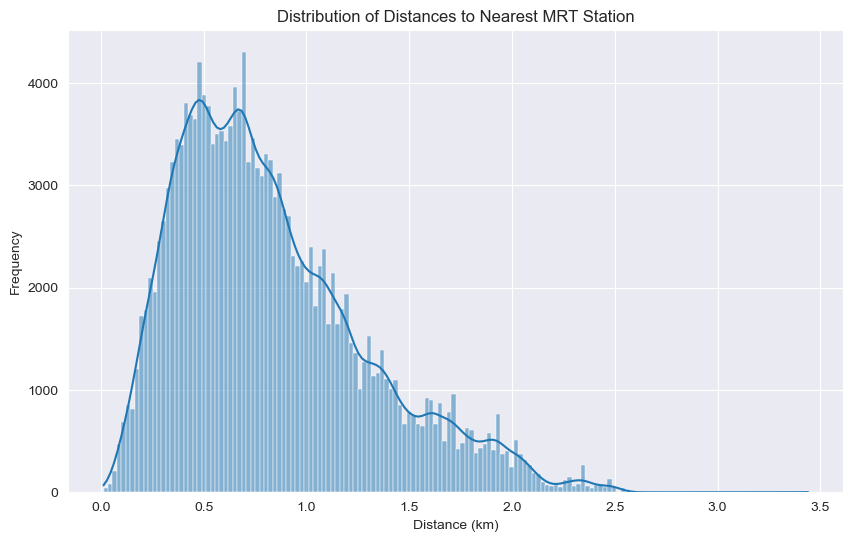

In [ ]:
# Histogram of distances to nearest MRT station
plt.figure(figsize=(10, 6))
sns.histplot(resale_zipcode['mrt_dist'], kde=True)
plt.title('Distribution of Distances to Nearest MRT Station')
plt.xlabel('Distance (km)')
plt.ylabel('Frequency')
plt.show()

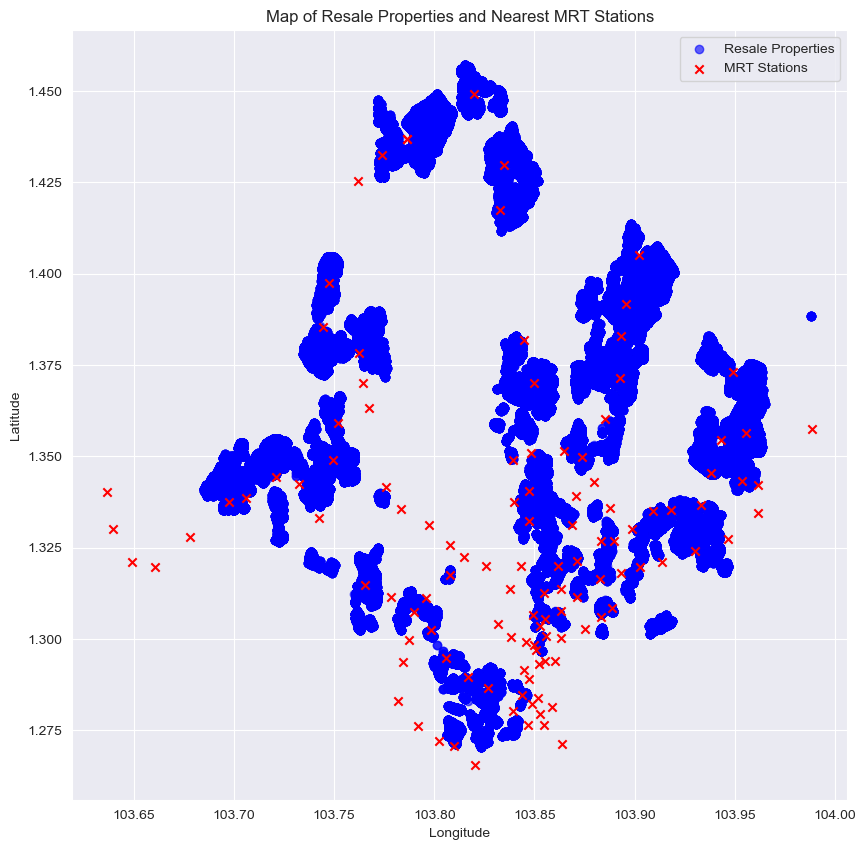

In [ ]:
# Scatter plot of resale properties and MRT stations
plt.figure(figsize=(10, 10))
plt.scatter(resale_zipcode['lng'], resale_zipcode['lat'], alpha=0.6, label='Resale Properties', color='blue')
plt.scatter(mrt_locations['lng'], mrt_locations['lat'], marker='x', label='MRT Stations', color='red')
plt.title('Map of Resale Properties and Nearest MRT Stations')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend()
plt.show()

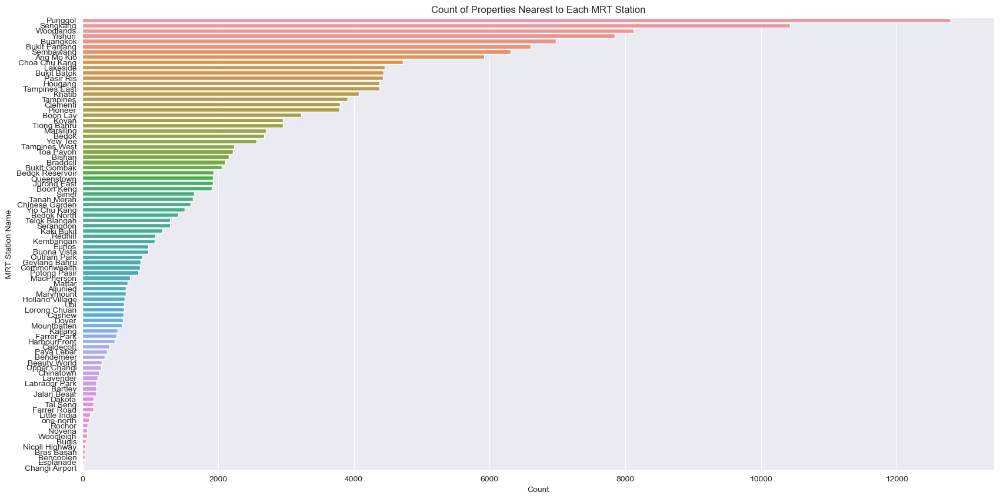

In [ ]:
# Bar plot for count of properties nearest to each MRT station
plt.figure(figsize=(20, 10))
sns.countplot(data=resale_zipcode, y='nearest_mrt', order=resale_zipcode['nearest_mrt'].value_counts().index)
plt.title('Count of Properties Nearest to Each MRT Station')
plt.xlabel('Count')
plt.ylabel('MRT Station Name')
plt.show()

In [ ]:
knn = KNeighborsClassifier(n_neighbors=1)
knn.fit(mall_locations[['lat', 'lng']], mall_locations['name'])

resale_zipcode['nearest_mall'] = knn.predict(resale_zipcode[['lat', 'lng']])

_, nearest_indices = knn.kneighbors(resale_zipcode[['lat', 'lng']])

nearest_mall_coords = mall_locations.iloc[nearest_indices.flatten()][['lat', 'lng']].values

resale_zipcode['mall_dist'] = [
    earth_distance((lat1, lng1), (lat2, lng2))
    for (lat1, lng1), (lat2, lng2) in zip(resale_zipcode[['lat', 'lng']].values, nearest_mall_coords)
]

D:\Users\logic\anaconda3\envs\rec-py\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


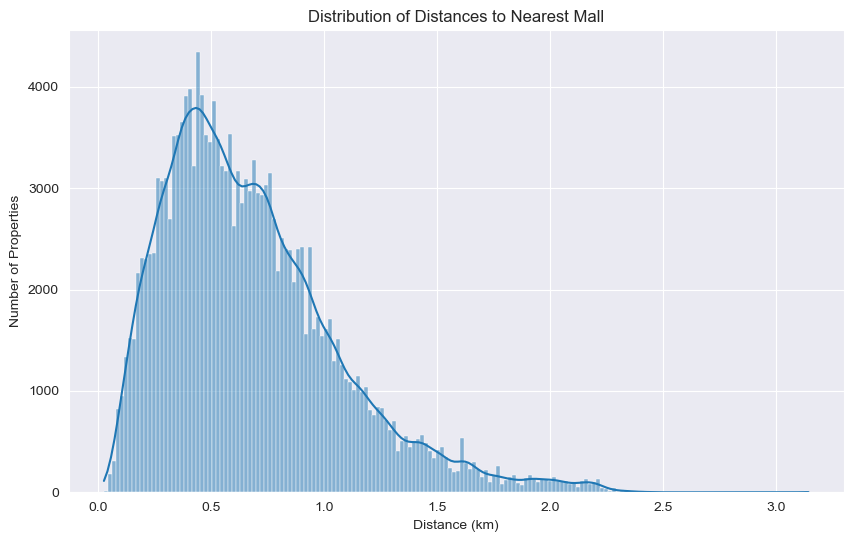

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Histogram of distances to nearest mall
plt.figure(figsize=(10, 6))
sns.histplot(resale_zipcode['mall_dist'], kde=True)
plt.title('Distribution of Distances to Nearest Mall')
plt.xlabel('Distance (km)')
plt.ylabel('Number of Properties')
plt.show()

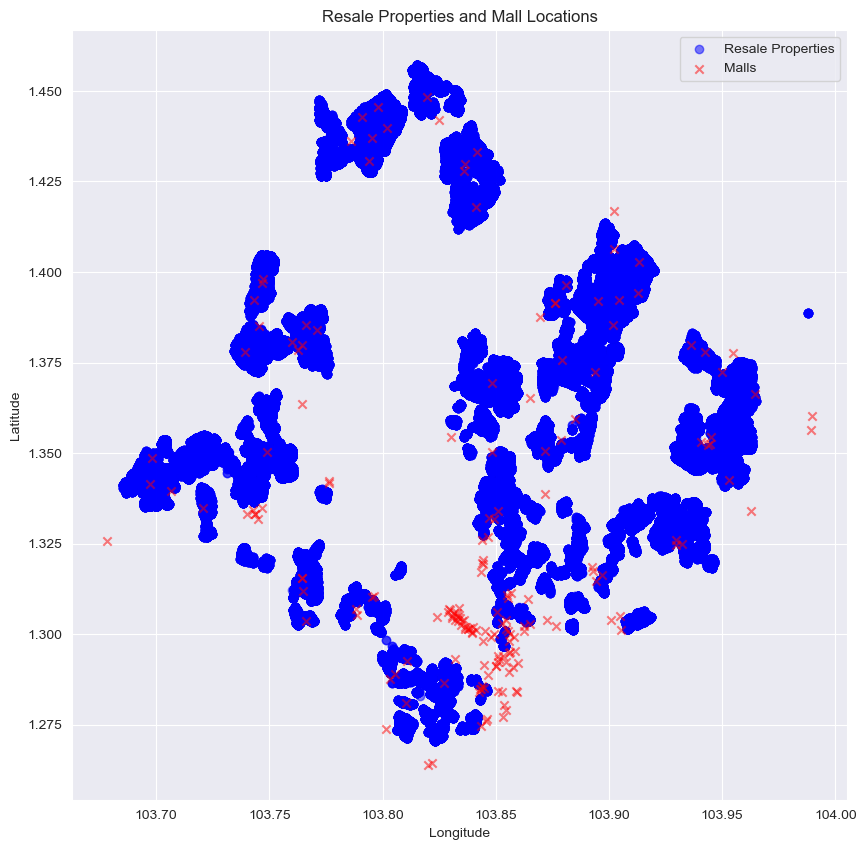

In [ ]:
#  Scatter plot of resale properties and mall locations
plt.figure(figsize=(10, 10))
plt.scatter(resale_zipcode['lng'], resale_zipcode['lat'], label='Resale Properties', alpha=0.5, color='blue')
plt.scatter(mall_locations['lng'], mall_locations['lat'], label='Malls', alpha=0.5, color='red', marker='x')
plt.title('Resale Properties and Mall Locations')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend()
plt.show()

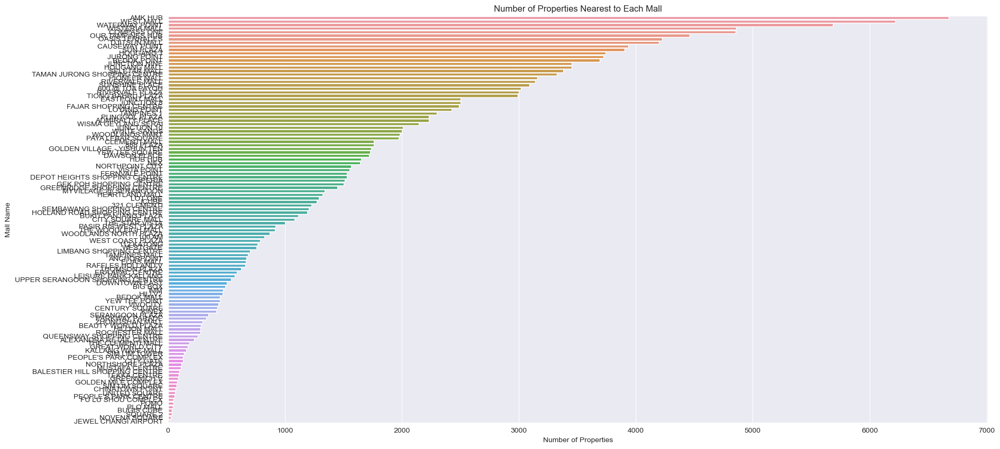

In [ ]:
# Bar plot of number of properties nearest to each mall
plt.figure(figsize=(20, 10))
sns.countplot(data=resale_zipcode, y='nearest_mall', order=resale_zipcode['nearest_mall'].value_counts().index)
plt.title('Number of Properties Nearest to Each Mall')
plt.xlabel('Number of Properties')
plt.ylabel('Mall Name')
plt.show()

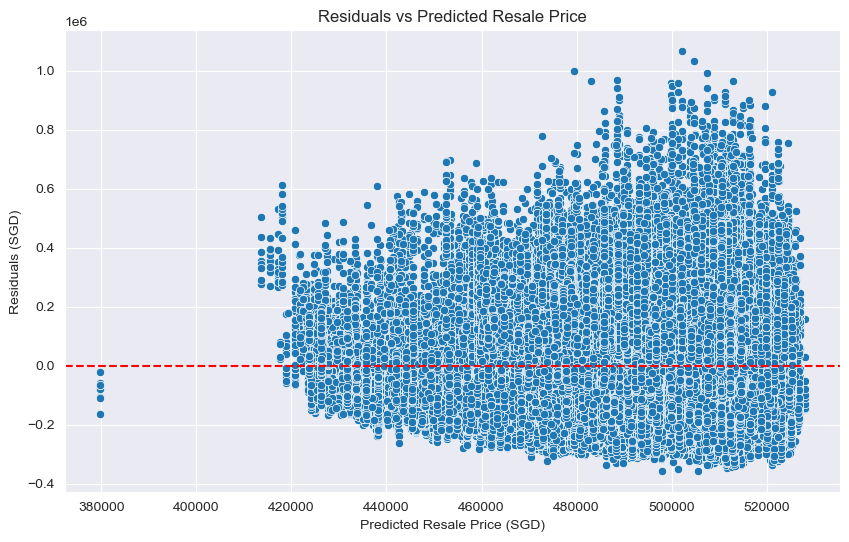

In [ ]:
from sklearn.linear_model import LinearRegression
import numpy as np

# Fit a linear regression model
X = resale_zipcode[['mall_dist']]  # Predictor
y = resale_zipcode['resale_price']  # Response
model = LinearRegression().fit(X, y)

# Calculate residuals
resale_zipcode['predicted'] = model.predict(X)
resale_zipcode['residuals'] = resale_zipcode['resale_price'] - resale_zipcode['predicted']

# Residual Plot
plt.figure(figsize=(10, 6))
sns.scatterplot(x=resale_zipcode['predicted'], y=resale_zipcode['residuals'])
plt.title('Residuals vs Predicted Resale Price')
plt.xlabel('Predicted Resale Price (SGD)')
plt.ylabel('Residuals (SGD)')
plt.axhline(y=0, color='red', linestyle='--')
plt.show()

## 3. Data preparation

In [14]:
project_data = resale_zipcode.copy()

Drop out features that are not informative under the prediction context.

In [15]:
project_data = project_data.drop(columns=['searchval','building','lease_commence_date'])

#### a. Convert useful string variables into numerical variables

In [16]:
project_data['flat_type'] = pd.to_numeric(project_data['flat_type'].str.extract('(\d+)')[0], errors='coerce')

project_data.dropna(subset=['flat_type'], inplace=True)
project_data['flat_type'] = project_data['flat_type'].astype(int)

#### b. Ordinal Encoding for some meaningful categorical variables

In [17]:
unique_values = project_data['storey_range'].unique()
print(unique_values)

['10 TO 12' '01 TO 03' '07 TO 09' '04 TO 06' '13 TO 15' '28 TO 30'
 '16 TO 18' '22 TO 24' '19 TO 21' '25 TO 27' '34 TO 36' '31 TO 33'
 '37 TO 39' '40 TO 42' '46 TO 48' '43 TO 45' '49 TO 51']


In [18]:
storey_mapping = {
    '01 TO 03': 1, '04 TO 06': 1, '07 TO 09': 2, '10 TO 12': 2,
    '13 TO 15': 3, '16 TO 18': 3, '19 TO 21': 4, '22 TO 24': 4,
    '25 TO 27': 5, '28 TO 30': 5, '31 TO 33': 6, '34 TO 36': 6,
    '37 TO 39': 7, '40 TO 42': 7, '43 TO 45': 8, '46 TO 48': 8,
    '49 TO 51': 9
}

project_data['storey_level'] = project_data['storey_range'].map(storey_mapping).astype(int)

### c. Handle Missing data

In [19]:
project_data = project_data.dropna()

### d. Drop categorical variables that may not as informative as expected

In [20]:
project_data = project_data.drop(['nearest_school', 'nearest_hospital', 'nearest_mrt', 'nearest_mall'], axis=1)

### e. Explore and understand the variables

In [21]:
def scatter_plot(variables):
    plt.figure(figsize=(18, 12))

    for i, var in enumerate(variables):
        plt.subplot(2, 2, i+1)
        plt.scatter(x=project_data[var], y=project_data['resale_price'], color='b')
        plt.xlabel(f'{var}', fontsize=13)
        plt.ylabel("Resale Price per sqm", fontsize=13)
        plt.title(f"{var} vs Resale Price per sqm", fontsize=15)

    plt.tight_layout()
    plt.show()

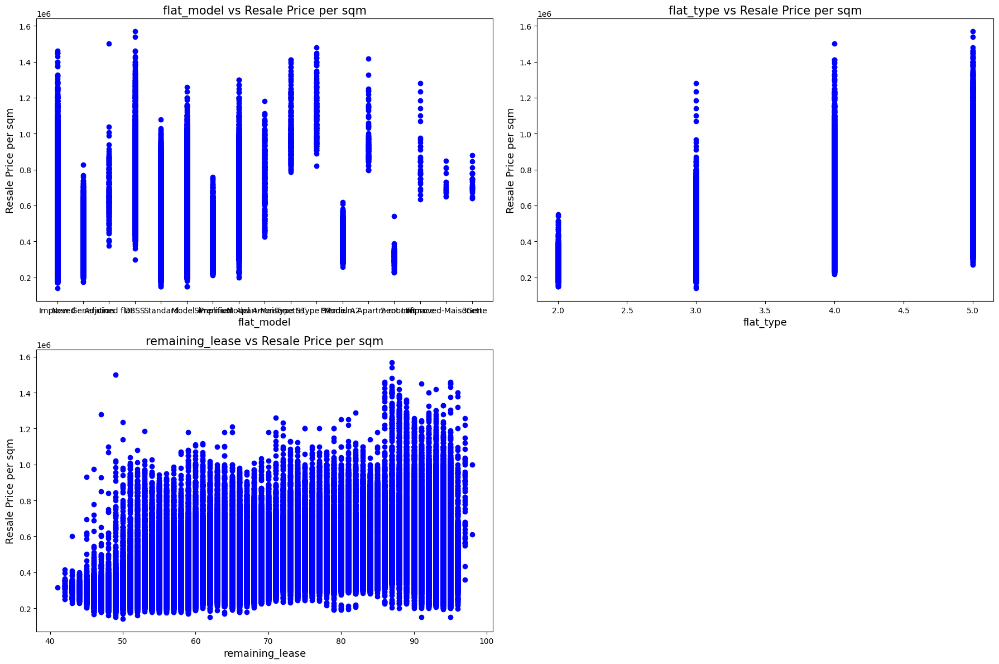

In [22]:
variables = ['flat_model' ,'flat_type', 'remaining_lease']
scatter_plot(variables)

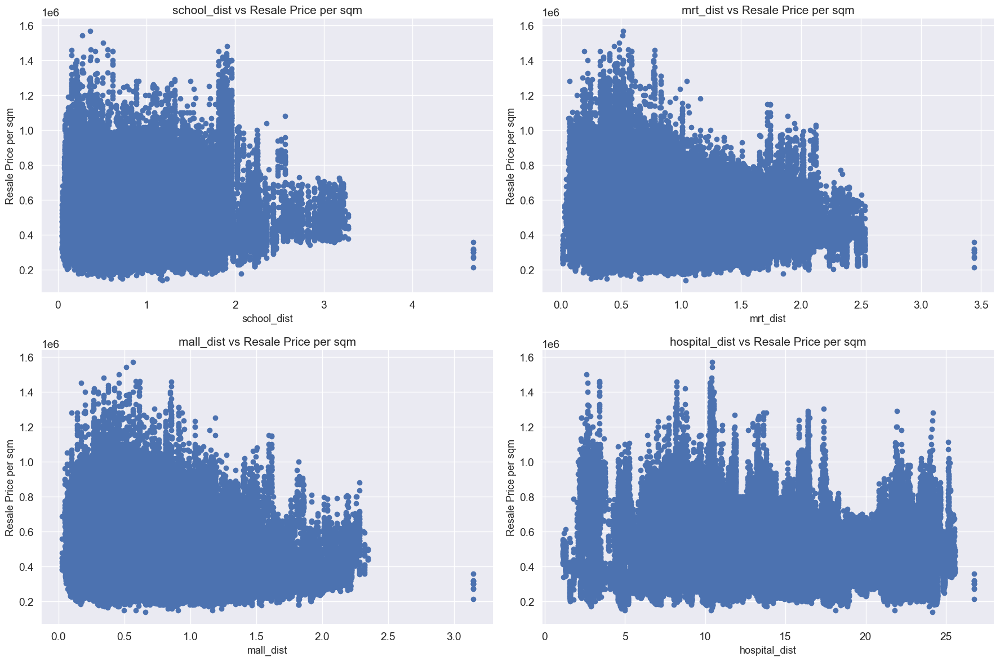

In [ ]:
variables = ['school_dist', 'mrt_dist', 'mall_dist', 'hospital_dist']
scatter_plot(variables)


### e. Handle outlier values based on the exploration

In [23]:
project_data.drop(project_data[(project_data['remaining_lease']<60) & (project_data['resale_price'] > 1150000)].index,inplace=True)
project_data.drop(project_data[(project_data['school_dist'] > 4) | (project_data['resale_price'] > 1450000)].index, inplace=True)
project_data.drop(project_data[(project_data['mrt_dist'] > 3.5) | (project_data['resale_price'] > 1450000)].index, inplace=True)
project_data.drop(project_data[(project_data['mall_dist'] > 2.5) | (project_data['resale_price'] > 1450000)].index, inplace=True)


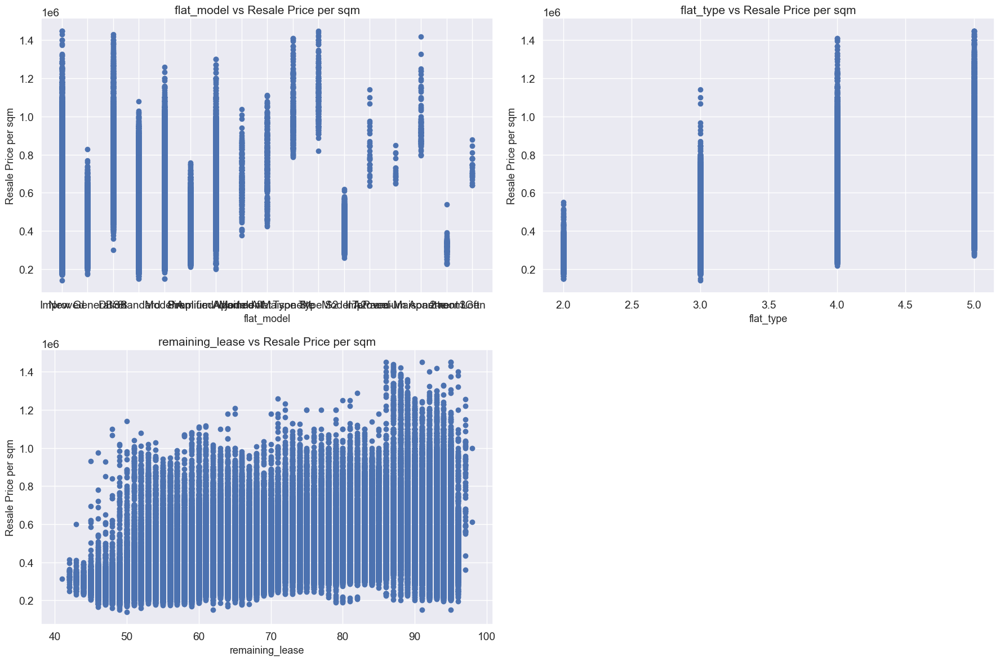

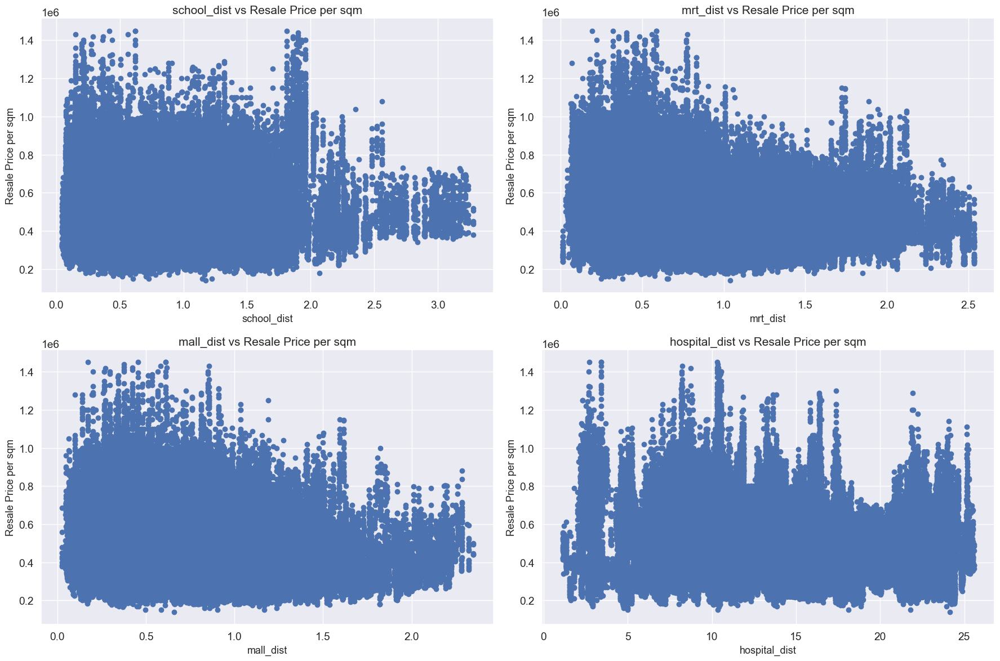

In [ ]:
# Show scatter plots after handling outlier values
variables = ['flat_model', 'flat_type', 'remaining_lease']
scatter_plot(variables)
variables = ['school_dist', 'mrt_dist', 'mall_dist', 'hospital_dist']
scatter_plot(variables)

In [ ]:
project_data.dtypes

month                    int32
town                    object
flat_type                int64
block                   object
street_name             object
storey_range            object
floor_area_sqm         float64
flat_model              object
lease_commence_date      int64
remaining_lease          int64
resale_price           float64
year                     int32
price_per_sqm          float64
zone                    object
postal                   int64
lat                    float64
lng                    float64
address                 object
school_dist            float64
hospital_dist          float64
mrt_dist               float64
mall_dist              float64
storey_level             int64
dtype: object

## 4. Data analysis and visualization

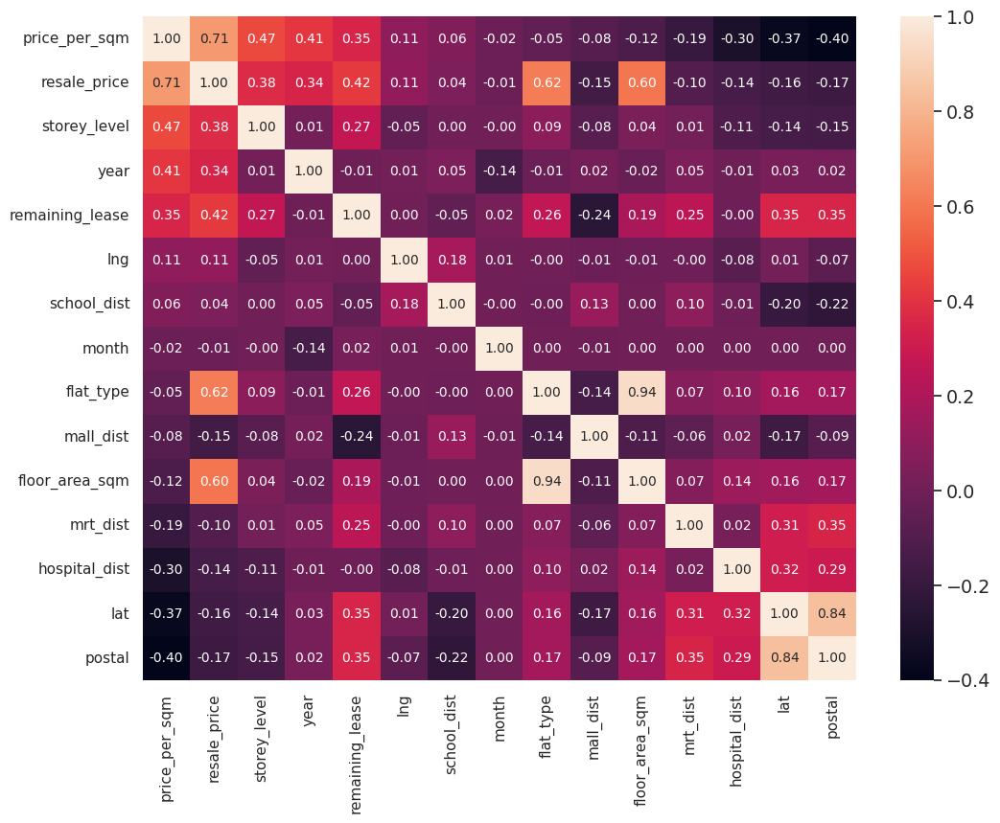

In [60]:
# Calculate correlation matrix using numeric data
project_data_numeric = project_data.select_dtypes(include=[np.number])
corr = project_data_numeric.corr()

k = len(project_data_numeric)
c = corr.nlargest(k, 'price_per_sqm')['price_per_sqm'].index

cm = np.corrcoef(project_data_numeric[c].values.T)

f, ax = plt.subplots(figsize=(12, 9))
sns.set(font_scale=1.25)
hm = sns.heatmap(cm, cbar=True, annot=True, fmt='.2f', annot_kws={'size': 10}, yticklabels=c.values, xticklabels=c.values)
plt.show()

It can be seen that storey_level, year and distance to the neareast hospital have the strongest correlation, followed by remaining_lease,lng, month, and flat_type. Since the postal, lng and lat are all the information about geographical location of the house, we choose lng and lat as the feature. Additionally, we choose the three features school_dist, mrt_dist, mall_dist, and hospital_dist to show the relationship between price and infrastructure around the house.

/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:2100: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


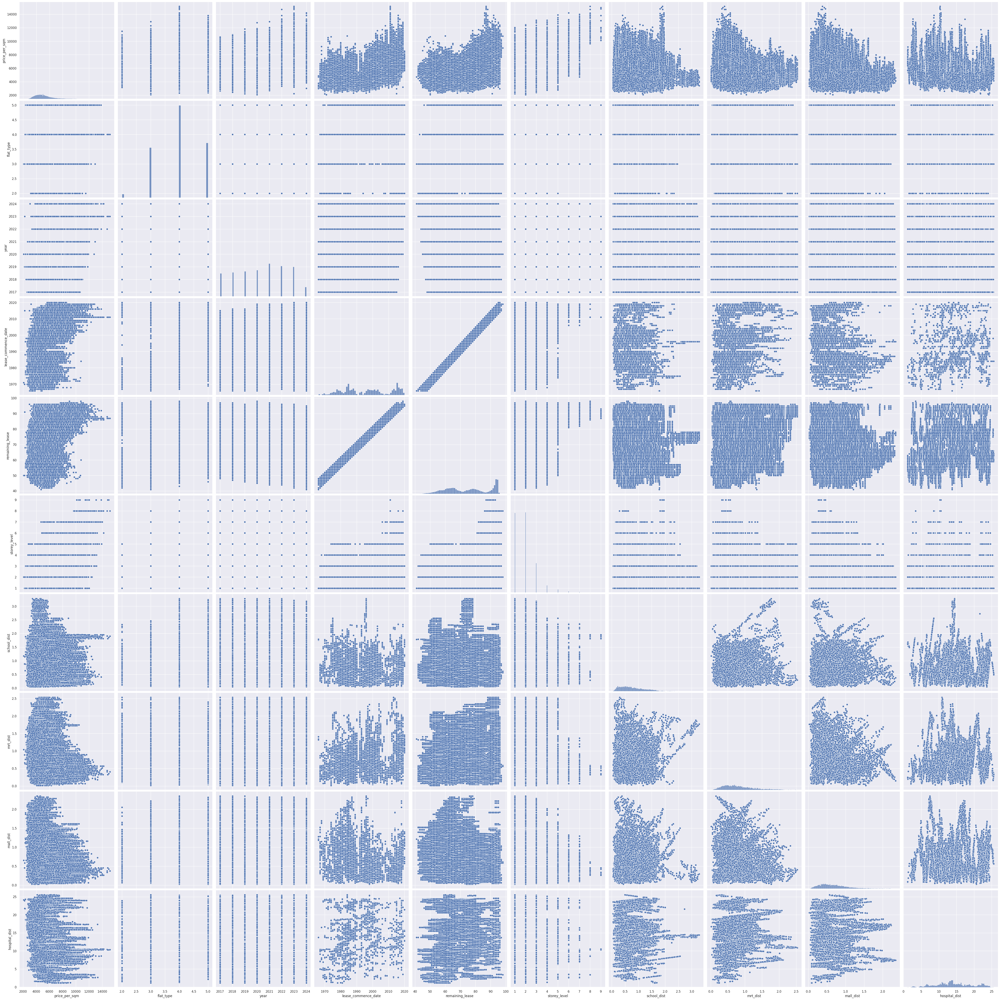

In [25]:
sns.set()
c_scatter=['price_per_sqm','flat_type','year','lease_commence_date','remaining_lease','storey_level','school_dist','mrt_dist','mall_dist','hospital_dist']
pair_scatter=sns.pairplot(project_data[c_scatter],size=5)
plt.show()

It shows that "price_per_sqm" is positively correlated with "lease_commence_date" and "remaining_lease", while "price_per_sqm" is negatively correlated with "school_dist", "mrt_dist", "mall_dist", and "hospital_dist", that is, the farther the distance , the price has a downward trend.


The boxplot illustrates the correlation between resale price and flat model. It reveals that flat model strongly influences flat positioning, with notable variations among different models. However, the standard model appears less informative, lacking precision in defining flat positioning.

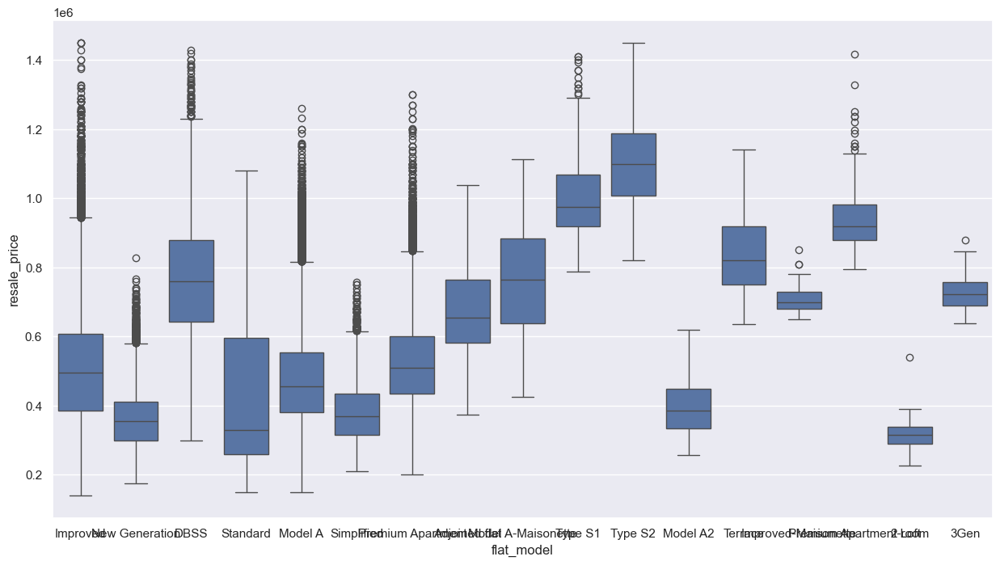

In [ ]:
import matplotlib.pyplot as plt
# Set the size of the boxplot
plt.figure(figsize=(15, 8))
sns.boxplot(x = "flat_model", y = "resale_price", data=project_data)
plt.show()

## 5. Modeling and visualization

In [26]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, PolynomialFeatures,OneHotEncoder
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.metrics import mean_squared_error, r2_score, make_scorer
from sklearn.neural_network import MLPRegressor
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.exceptions import ConvergenceWarning

### a. Visualize the target variable to predict and understand the distribution from it

The histogram of resale prices reveals a distribution resembling a normal curve but with a slight rightward skew.

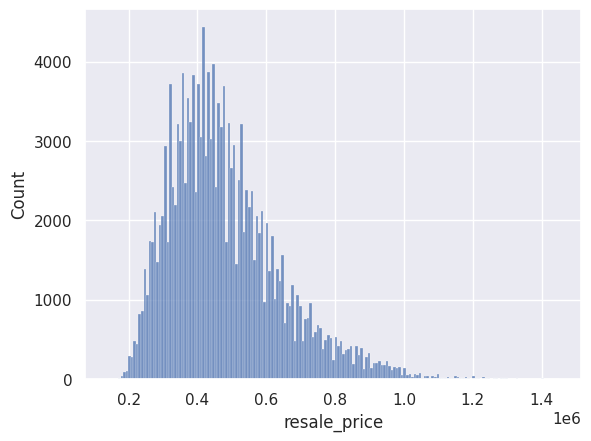

In [27]:
sns.histplot(project_data.resale_price)
plt.show()

Utilizing the 'log1p' function for the logarithmic transformation of resale prices, which exhibit a normal distribution. This transformation aims to enhance stability and uniformity in the data, facilitating more reliable predictions.

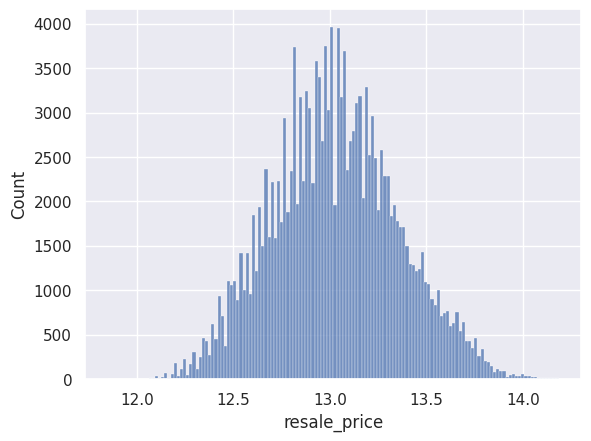

In [28]:
project_data["resale_price"] = np.log1p(project_data["resale_price"])
sns.histplot(project_data.resale_price)
plt.show()

### b.Feature selection and transformation

Choose features that exhibit a strong correlation with the price per square meter of resale properties while ensuring that adding these features does not significantly increase the model's dimensionality.

In [61]:
# 1. Select features:flat_model, flat_type, storey_level, remaining_lease, year, price_per_sqm, postal, school_dist, hospital_dist, mrt_dist, mall_dist, zone_id, storey_level
features = project_data[['flat_model', 'flat_type', 'storey_level', 'floor_area_sqm','remaining_lease', 'year', 'month','lat', 'lng','school_dist',
                        'hospital_dist','mrt_dist', 'mall_dist']]
labels = project_data['resale_price']

Divide the dataset into training and testing sets, allocating 20% of the data for testing purposes.

In [63]:
# 2. Split the data
X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size=0.3, random_state=66)

# Print the size of each set to confirm the split
print("Training set size:", X_train.shape[0])
print("Testing set size:", X_test.shape[0])

Training set size: 112315
Testing set size: 48136


Normalize the numerical variables and convert categorical variables into a suitable format for model training.

In [64]:
# 3. Data transformation based on the data type
# Assuming cat_cols contains the names of categorical columns
cat_cols = ['flat_model']

# Define the transformer for categorical columns
cat_transformer = OneHotEncoder(handle_unknown='ignore')

# Define the transformer for numerical columns (already included in the pipeline)
num_transformer = StandardScaler()

# Combine the transformers using ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('num', num_transformer, features.select_dtypes(include=['int64', 'float64']).columns),
        ('cat', cat_transformer, cat_cols)
    ])

# Preprocess the data first
X_train_scaled = preprocessor.fit_transform(X_train)
X_test_scaled = preprocessor.transform(X_test)

In [34]:
X_train_scaled.shape

(128360, 28)

### c. Linear Regression Model

MSE of LinearRegression: 0.03174721421840839
R^2 of LinearRegression: 0.6972094360233274


Text(0.5, 1.0, 'Scatter plot of LinearRegression Model')

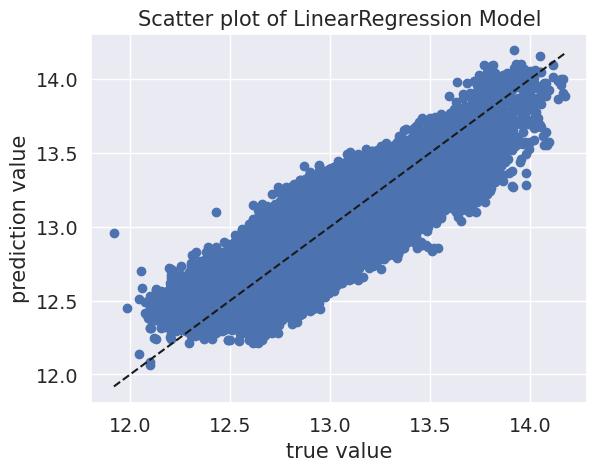

In [65]:
# LinearRegression
linear_regressor = LinearRegression()
linear_regressor.fit(X_train_scaled, y_train)
linear_predictions = linear_regressor.predict(X_test_scaled)
print("MSE of LinearRegression:", mean_squared_error(y_test, linear_predictions))
print("R^2 of LinearRegression:", r2_score(y_test, linear_predictions))

plt.scatter(y_test, linear_predictions)
plt.plot([y_test.min(),y_test.max()], [y_test.min(),y_test.max()], 'k--')
plt.xlabel('true value')
plt.ylabel('prediction value')
plt.title('Scatter plot of LinearRegression Model')

The linear regression model has an R-squared value of 69.72% and an MSE of 0.032, indicating that simple linear regression cannot explain the house price very well.

### d. Plynomial Regression Model

MSE of PolynomialFeatures: 0.022398700006317922
r2 of PolynomialFeatures: 0.7863713344862635


Text(0.5, 1.0, 'Scatter plot of PolynomialFeatures Model')

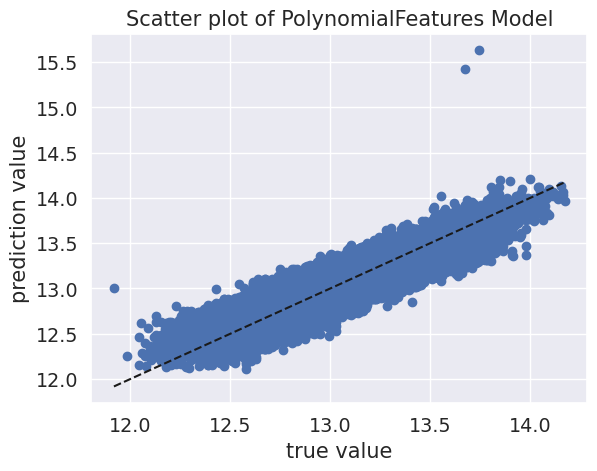

In [66]:
# PolynomialFeatures
poly_features = PolynomialFeatures(degree=2)
X_train_poly = poly_features.fit_transform(X_train_scaled)
X_test_poly = poly_features.transform(X_test_scaled)

poly_regressor = LinearRegression()
poly_regressor.fit(X_train_poly, y_train)
poly_predictions = poly_regressor.predict(X_test_poly)
print("MSE of PolynomialFeatures:", mean_squared_error(y_test, poly_predictions))
r2 = r2_score(y_test, poly_predictions)
print("r2 of PolynomialFeatures:", r2)

plt.scatter(y_test, poly_predictions)
plt.plot([y_test.min(),y_test.max()], [y_test.min(),y_test.max()], 'k--')
plt.xlabel('true value')
plt.ylabel('prediction value')
plt.title('Scatter plot of PolynomialFeatures Model')

We using the optimal parameter degree=2, and finnally, the PolynomialFeatures model has an R-squared value of 78.63% and an MSE of 0.0224, indicating that polynomial functions improves the understanding of the house price but the improvement is not huge.

### e. Random Forest

After trying multiple parameter value combinations with GridSearchCV and fine-tuning, We achieved the best results to set n_estimators to 200, max_features to sqrt, which is default, and max_depth is non.

MSE of RandomForestRegressor: 0.004438004101542685
r2 of RandomForestRegressor: 0.9576723250237902


Text(0.5, 1.0, 'Scatter plot of RandomForestRegressor Model')

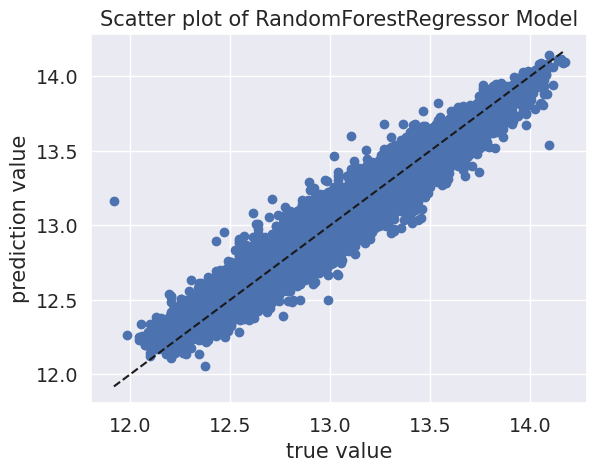

In [67]:
# RandomForestRegressor
random_forest_regressor = RandomForestRegressor(n_estimators=200, random_state=42)
random_forest_regressor.fit(X_train_scaled, y_train)
forest_predictions = random_forest_regressor.predict(X_test_scaled)

print("MSE of RandomForestRegressor:", mean_squared_error(y_test, forest_predictions))
r2 = r2_score(y_test, forest_predictions)
print("r2 of RandomForestRegressor:", r2)

plt.scatter(y_test, forest_predictions)
plt.plot([y_test.min(),y_test.max()], [y_test.min(),y_test.max()], 'k--')
plt.xlabel('true value')
plt.ylabel('prediction value')
plt.title('Scatter plot of RandomForestRegressor Model')

The final model had an R-squared value of 95.76% and MSE of 0.0044, showing a much better predictive performance.

### f. Neural Network

A grid search is conducted to explore various combinations of hyperparameters and identify the neural network regressor that can accurately handle the task.

In [53]:
# Rename to data frame to project_data as the start point for model training
import warnings
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder,StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, r2_score, make_scorer
from sklearn.neural_network import MLPRegressor
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.exceptions import ConvergenceWarning

X = project_data.drop('resale_price', axis=1)  # Features
y = project_data['resale_price']  # Target variable


# Assuming cat_cols contains the names of categorical columns
cat_cols = ['flat_model']

# Define the transformer for categorical columns
cat_transformer = OneHotEncoder(handle_unknown='ignore')

# Define the transformer for numerical columns (already included in the pipeline)
num_transformer = StandardScaler()

# Combine the transformers using ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('num', num_transformer, X.select_dtypes(include=['int64', 'float64']).columns),
        ('cat', cat_transformer, cat_cols)
    ])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=66)

# Preprocess the data first
X_train_transfered = preprocessor.fit_transform(X_train)
X_test_transfered = preprocessor.transform(X_test)

scorer = make_scorer(mean_squared_error, greater_is_better=False)

param_grid = {
    'hidden_layer_sizes': [(50,), (100,)],  # Different hidden layer sizes
    'activation': ['relu'],  # Activation functions
    'alpha': [0.0001, 0.001, 0.01],  # L2 regularization parameter
    'learning_rate': ['adaptive'],  # Learning rate strategy
}

grid_search = GridSearchCV(
    estimator=MLPRegressor(max_iter=20, random_state=66),
    param_grid=param_grid,
    cv=5,
    scoring=scorer,
    verbose=1,
    n_jobs=-1,
    error_score='raise',
    return_train_score=True,
    refit=True,
)


with warnings.catch_warnings():
    warnings.filterwarnings("ignore", category=ConvergenceWarning)
    grid_search.fit(X_train_transfered, y_train)

best_params = grid_search.best_params_
print("Best Parameters:", best_params)

best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test_transfered)
mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error:", mse)



Fitting 5 folds for each of 6 candidates, totalling 30 fits
Best Parameters: {'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (100,), 'learning_rate': 'adaptive'}
Mean Squared Error: 0.0008055570561968069


Train the neural network regressor using the best hyperparameters and run it for 20 epochs to generate predictions. The model achieves an R-squared value of 98.63% and a validation accuracy of 98.65%, indicating that the neural network regressor outperforms all previously tried models.

In [52]:
# Define the MLPRegressor
mlp_regressor = MLPRegressor(
    hidden_layer_sizes=(100,),
    max_iter=20,
    solver='adam',
    alpha=0.0001,  # L2 regularization parameter
    beta_1=0.9,   # Adam optimizer parameter
    beta_2=0.999, # Adam optimizer parameter
    early_stopping=True,  # Enable early stopping
    validation_fraction=0.2,  # Fraction of training data to use for validation
    verbose=True,
    random_state=20
)

# Fit the MLPRegressor on the training data
mlp_regressor.fit(X_train_transfered, y_train)

# Make predictions on the test data
nn_pred = mlp_regressor.predict(X_test_transfered)

# Evaluate the model's performance on the test data
print("MSE of RandomForestRegressor:", mean_squared_error(y_test, nn_pred))
r2 = r2_score(y_test, nn_pred)
print("R-squared (Test Data):", r2)

Iteration 1, loss = 14.10367134
Validation score: -14.781613
Iteration 2, loss = 0.53123822
Validation score: -5.159541
Iteration 3, loss = 0.22287267
Validation score: -1.636052
Iteration 4, loss = 0.09101301
Validation score: -0.069498
Iteration 5, loss = 0.03848423
Validation score: 0.503362
Iteration 6, loss = 0.01965158
Validation score: 0.715351
Iteration 7, loss = 0.01211056
Validation score: 0.812657
Iteration 8, loss = 0.00846142
Validation score: 0.862145
Iteration 9, loss = 0.00631852
Validation score: 0.894749
Iteration 10, loss = 0.00493440
Validation score: 0.916894
Iteration 11, loss = 0.00395423
Validation score: 0.932546
Iteration 12, loss = 0.00323418
Validation score: 0.944141
Iteration 13, loss = 0.00268463
Validation score: 0.954869
Iteration 14, loss = 0.00220157
Validation score: 0.961153
Iteration 15, loss = 0.00184503
Validation score: 0.968499
Iteration 16, loss = 0.00155259
Validation score: 0.973205
Iteration 17, loss = 0.00130727
Validation score: 0.978097


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.



## 6. Report Insight and Conclusion

In [54]:
import pandas as pd
original_values = np.expm1(nn_pred)
y_pred_series = pd.Series(original_values, name='Prediction', index=X_test.index)
joined_data = project_data.join(y_pred_series, how='right')
joined_data['Predicted Price per sqm'] = joined_data['Prediction']/joined_data['floor_area_sqm']

Create an interactive geographic heatmap to visualize the best-predicted price per square meter across all our trained models, along with other geographic details of the listings.

In [55]:
import plotly.express as px

fig = px.density_mapbox(joined_data, lat='lat', lon='lng', z='Predicted Price per sqm', radius=5,
                        center=dict(lat=joined_data.lat.mean(),
                                    lon=joined_data.lng.mean()), zoom=11,
                       mapbox_style="open-street-map", height=900, opacity=0.8,
                        hover_name='town',
                         hover_data={'town': True, 'postal': True,
                                     'school_dist': True, 'mrt_dist': True,
                                     'mall_dist': True,
                                     'Predicted Price per sqm': ':.2f'},
                        color_continuous_scale="Viridis")
fig.update_layout(mapbox_style="carto-positron")

# Update hover template to display specific columns
fig.update_traces(hovertemplate='<b>%{hovertext}</b><br>'
                                 'Postal Code: %{customdata[1]}<br>'
                                 'School Distance: %{customdata[2]:.2f} km<br>'
                                 'MRT Distance: %{customdata[3]:.2f} km<br>'
                                 'Mall Distance: %{customdata[4]:.2f} km<br>'
                                 'Predicted Price per sqm: $%{z:.2f}<extra></extra>')
fig.show()


We aim to interpret the most influential factors contributing to resale prices using the good-performing model, Random Forest.

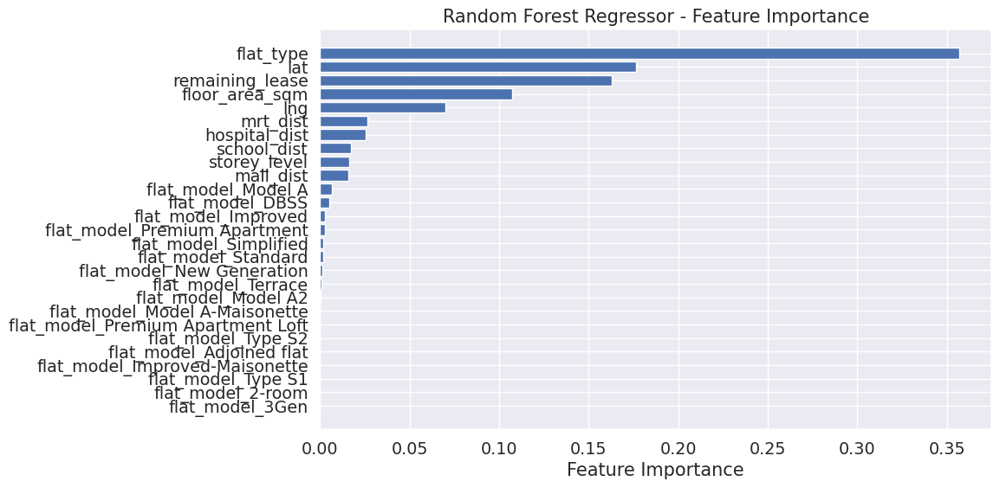

In [68]:
# Get feature importances from the model
importances = random_forest_regressor.feature_importances_

# Get feature names after one-hot encoding
# Fit the categorical transformer
cat_transformer.fit(features[cat_cols])

# Get feature names after one-hot encoding
cat_encoded_features = list(cat_transformer.get_feature_names_out(cat_cols))

numerical_features = list(features.select_dtypes(include=['int64', 'float64']).columns)
feature_names = numerical_features + cat_encoded_features

# Sort feature importances in descending order
sorted_indices = importances.argsort()[::-1]
sorted_importances = importances[sorted_indices]
sorted_feature_names = [feature_names[i] for i in sorted_indices]

# Plotting the feature importances
plt.figure(figsize=(10, 6))
plt.barh(sorted_feature_names, sorted_importances, align='center')
plt.xlabel('Feature Importance')
plt.title('Random Forest Regressor - Feature Importance')
plt.gca().invert_yaxis()  # Invert y-axis to show most important features at the top
plt.show()

According to the feature importance chart derived from the Random Forest model, the top five key factors influencing resale prices are flat type, geographical location, remaining lease years, distance to the nearest MRT station, and proximity to hospitals and schools.